# Week VI: Computer Vision

## Reading images with OpenCV

We'll begin by learning how to work with images in Python. Let's read the first image that appears in the Wikipedia section about images:


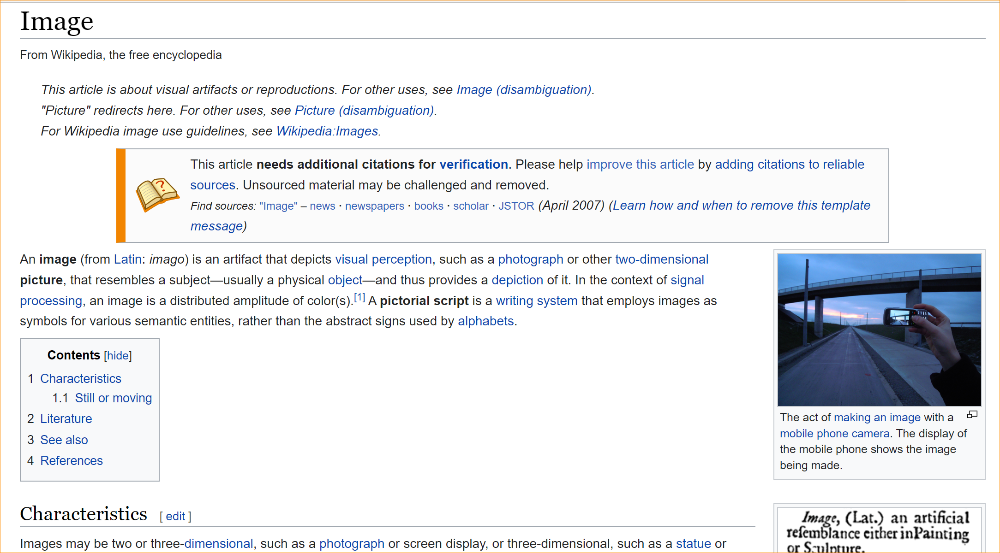

Its URL can be found here: https://upload.wikimedia.org/wikipedia/commons/thumb/b/b6/Image_created_with_a_mobile_phone.png/440px-Image_created_with_a_mobile_phone.png

We'll use openCV and skimage to read the image. Let's begin with the imports:

In [ ]:
import cv2  # OpenCV
from google.colab.patches import cv2_imshow  # Addon for OpenCV specifcally for Google Colab
from skimage import io

We'll read the image from the URL using skimage:

In [ ]:
img = io.imread('https://upload.wikimedia.org/wikipedia/commons/thumb/b/b6/Image_created_with_a_mobile_phone.png/440px-Image_created_with_a_mobile_phone.png')

And display it using OpenCV:

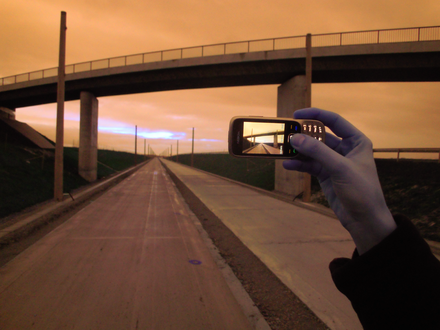

In [ ]:
cv2_imshow(img)

## Flowers dataset



We'll perform a task on a high-resolution flowers dataset. It can be viewed  [here](https://knowyourdata-tfds.withgoogle.com/#tab=STATS&dataset=tf_flowers). We'll use Tensorflow datasets to get it:

In [ ]:
import tensorflow as tf
import pathlib
dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file(origin=dataset_url,
                                   fname='flower_photos',
                                   untar=True)
data_dir = pathlib.Path(data_dir)

Note that not all images in this dataest have the same shape. We can use Keras to transfor all images to be of shape (128, 128, 3), where (height, width, channels). All iamges are RGB so we have 3 channels.

The datset has 3670 samples, which we plan to load all at once:

In [ ]:
img_height = 128
img_width = 128
data = tf.keras.utils.image_dataset_from_directory(data_dir, image_size=(img_height, img_width), batch_size=3670)
data

Found 3670 files belonging to 5 classes.


<BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

We got a BatchDataset object. We want to transform it to a numpy array:

In [ ]:
import numpy as np
data_array = list(data.take(1).as_numpy_iterator())[0][0]
data_array.shape

(3670, 128, 128, 3)

So we have 3670 samples, such that each image contains 128X128 pixels with 3 RGB channels. Let's view some images:

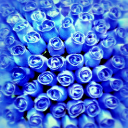

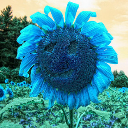

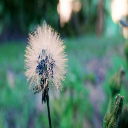

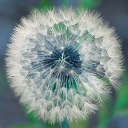

In [ ]:
cv2_imshow(data_array[0])
cv2_imshow(data_array[1])
cv2_imshow(data_array[100])
cv2_imshow(data_array[-1])

## Image noise

One of the most common problems in the field of computer vision (and image processing) is denoising. Given a noisy/blurry image, we want to construct a clean image without the noise. 


We can define our labels as the normalized clean data:

In [ ]:
Y = data_array / 255.

Let's add Gaussian noise to the images to create our X: 

In [ ]:
X = Y + 0.5*np.random.normal(size=Y.shape)

We want to prevent a memory overflow. Since we no longer need data_array, we can delete it using the garbage collector to free up space:

In [ ]:
import gc
del data_array
gc.collect()

252

We discard values outside the range of [0, 1]:

In [ ]:
X = np.clip(X, 0, 1)

We'll create a simple function to convert numpy arrays between [0, 1] to OpenCV readable images:

In [ ]:
def np_to_cv(array):
  return np.uint8(array * 255)

Let's see a noisy and non-noisy image:

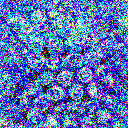

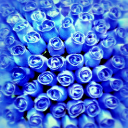

In [ ]:
cv2_imshow(np_to_cv(X[0, :, :, :]))
cv2_imshow(np_to_cv(Y[0, :, :, :]))

As usual, train-test-validation split:

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)
x_test, x_val, y_test, y_val = train_test_split(x_test, y_test, test_size=0.5, random_state=42)

Verification:

In [ ]:
print(x_train.shape)
print(x_test.shape)
print(x_val.shape)

(2936, 128, 128, 3)
(367, 128, 128, 3)
(367, 128, 128, 3)


## Classical image processing approach

There are some standard methods from the field of image processing that were developed long before deep learning. Let's see how they perform on our images.

Let's build a function that add noise to an image, and then performs denoising using OpenCV. We're going to use OpenCV's fastNlMeansDenoisingColored which is an implementation of the [non-local means](https://en.wikipedia.org/wiki/Non-local_means) algorithm.

In [ ]:
def noise_and_denoise(noise_level, image, params=(None, 10, 10, 7, 21), show=True):
  # Setting a constant seed to replicate the same randomness
  np.random.seed(42)
  img = np_to_cv(image)

  # Adding noise
  noisy = np.clip(img / 255. + noise_level*np.random.normal(size=img.shape), 0, 1)
  noisy = np_to_cv(noisy)

  # Denoising
  denoised = cv2.fastNlMeansDenoisingColored(noisy, *params)

  if show:
    cv2_imshow(img)
    cv2_imshow(noisy)
    cv2_imshow(denoised)
  return img, denoised

This function has three inputs: the noise level, the image itself, and parameters for the OpenCV denoising algorithm. Let's try it out with different noise levels and denosing configurations:

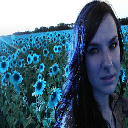

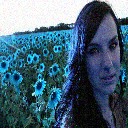

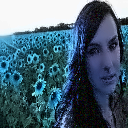

In [ ]:
img, denoised = noise_and_denoise(0.05, y_test[50, :, :, :])

We can also mesure how well the algorithm performs using MSE, [structural similarity (SSIM)](https://en.wikipedia.org/wiki/Structural_similarity), and [peak signal-to-noise ration (PSNR)](https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio) which are 3 of the most common metrics in image processing.

They are defined by:

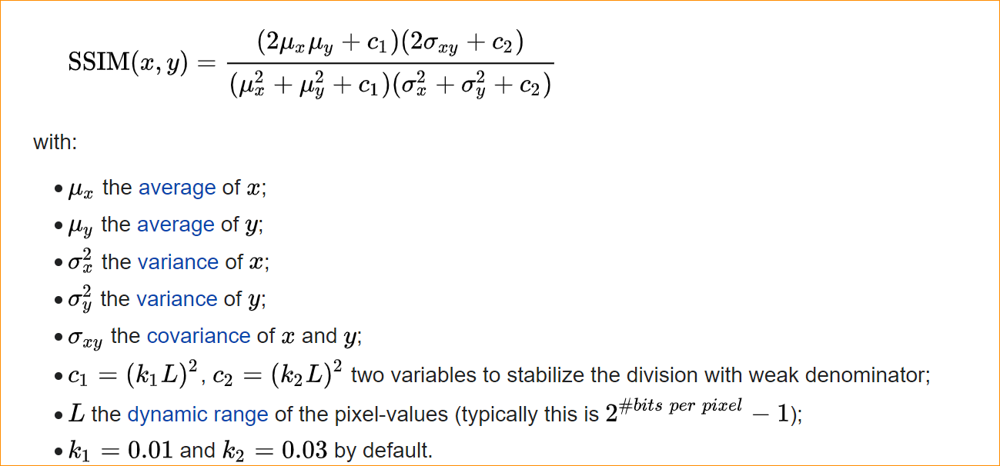

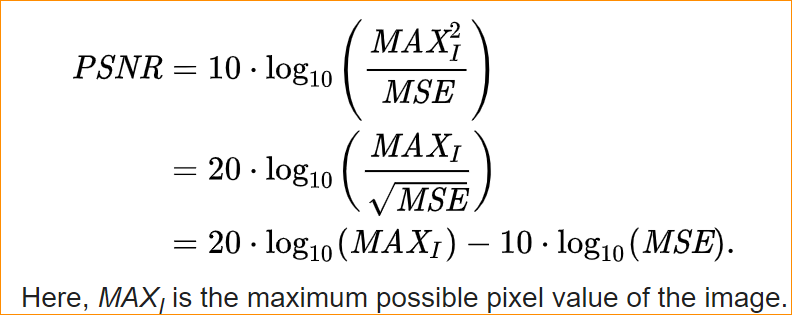

Let's build a function to compute these metrics:

In [ ]:
from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import mean_squared_error


def evaluate_images(img1, img2):
  metrics_dict = {}
  metrics_dict['SSIM'] = ssim(img1, img2, multichannel=True)
  metrics_dict['PSNR'] = cv2.PSNR(img1, img2)
  metrics_dict['MSE'] = (((img1/255. - img2/255.))**2).mean()
  return metrics_dict


Sanity check, let's compare two identical images:

In [ ]:
evaluate_images(img, img)

{'MSE': 0.0, 'PSNR': 361.20199909921956, 'SSIM': 1.0}

Their MSE is 0, and their SSIM is 1 - both perfect scores. In the case of PSNR we get ~361 which is basically the equivalent of infinity on logarithmic scale.

So ideally we want:

*   **MSE ~ 0**
*   **PSNR >> 0**
*   **SSIM ~ 1**

Let's compute the merics for 5% noise:

In [ ]:
evaluate_images(img, denoised)

{'MSE': 0.002555172089260541,
 'PSNR': 25.925798450793927,
 'SSIM': 0.8654553080750742}

When facing a small amount off noise (5%) he algorithm performs well, while sliightly blurring the image. Let's add more noise:

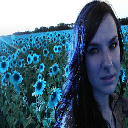

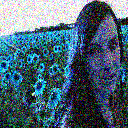

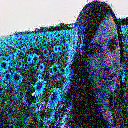

{'MSE': 0.025811565926666825,
 'PSNR': 15.881856470376565,
 'SSIM': 0.4768337672750154}

In [ ]:
img, denoised = noise_and_denoise(0.2, y_test[50, :, :, :])
evaluate_images(img, denoised)

Now with 20% noise the performance of the algorithm deteriorates. There's still a noticeable amount of noise, as seen by the major drop in the metrics. Let's reconfigure the parameters:

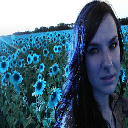

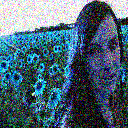

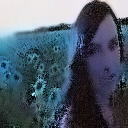

{'MSE': 0.012771953820846149,
 'PSNR': 18.937426603947248,
 'SSIM': 0.6060999641700379}

In [ ]:
img, denoised = noise_and_denoise(0.2, y_test[50, :, :, :], params=(None, 30, 30, 7, 21))
evaluate_images(img, denoised)

Now most noise is gone, but we still have this blur effect. Notice how the SSIM almost doubled!
Let's increase the noise to the level we have in our data (100%):

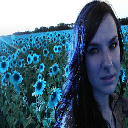

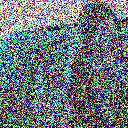

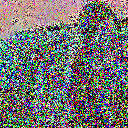

{'MSE': 0.17534555926256326,
 'PSNR': 7.5610522842625105,
 'SSIM': 0.08012298826930192}

In [ ]:
img, denoised = noise_and_denoise(1, y_test[50, :, :, :], params=(None, 30, 30, 7, 21))
evaluate_images(img, denoised)

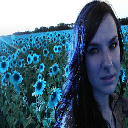

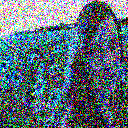

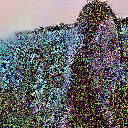

{'MSE': 0.0666101179033705,
 'PSNR': 11.764597976186568,
 'SSIM': 0.28970991945735985}

In [ ]:
img, denoised = noise_and_denoise(0.5, y_test[50, :, :, :], params=(None, 30, 30, 7, 21))
evaluate_images(img, denoised)

Let's try a deep learning approach.

## Neural network denoising

One class of neural networks in autoencoders. Autoencoders work by shirnking the input image through multiple convolutional and pooling layers, and then slowly increasing it back to its original size.

Classical autoencoders are often unsupervised, but in this example we're going to use a supervised version.

Autoencoders are relatively old and they have their own problems. Some other concepts have been shown to achieve good results in similar problems since the conception of autoencoders, including GANs and RNNs. Nevertheless autoencoders are an important cornerstone in the development of deep learning, and they still form an interesting set of architectures 

### Building an AI pipeline

We want to use the PSNR metric:

In [ ]:
def psnr_metric(y_true, y_pred):
  return tf.image.psnr(y_true, y_pred, 1.0)

Create Tensorboard logdir:

In [ ]:
from keras.callbacks import TensorBoard
import os
import datetime
logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

And create an automated pipeline:

In [ ]:
from keras.callbacks import ModelCheckpoint

def run_model(model, x_train, y_train, x_val, y_val):
  model.compile(loss='mse', 
                optimizer='adam', 
                metrics=[psnr_metric])
  
  logdir = os.path.join("logs", model.name)
  tensorboard_callback = TensorBoard(logdir, histogram_freq=1)

  save_callback = ModelCheckpoint(model.name + '.h5', 
                                  save_best_only=True, 
                                  mode='max',
                                  monitor='val_psnr_metric', 
                                  verbose=1)
  
  model.fit(x_train, y_train, 
            validation_data=(x_val, y_val), 
            epochs=20, 
            batch_size=64, 
            callbacks=[tensorboard_callback, save_callback])

### Encoder-decoder

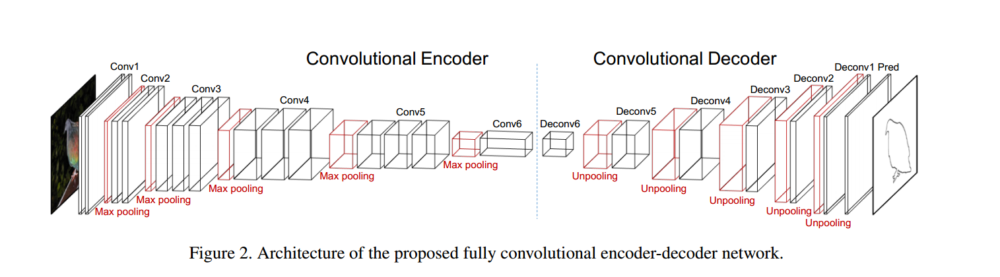

In [ ]:
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model

input_img = Input(shape=(128, 128, 3))  

# Encoding 
x = Conv2D(64, kernel_size=(3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D(pool_size=(2, 2), padding='same')(x)

x = Conv2D(32, kernel_size=(3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D(pool_size=(2, 2), padding='same')(x) 

x = Conv2D(16, kernel_size=(3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D(pool_size=(2, 2), padding='same')(x)

# Decoding 
x = Conv2D(16, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)

x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)

x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

encoder_decoder = Model(input_img, decoded, name='encoder_decoder')

In [ ]:
encoder_decoder.summary()

Model: "encoder_decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        18464     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 16)    

In [ ]:
run_model(encoder_decoder, x_train, y_train, x_val, y_val)

Epoch 1/20
46/46 [==============================] - ETA: 0s - loss: 0.0572 - psnr_metric: 13.1394
Epoch 1: val_psnr_metric improved from -inf to 15.73069, saving model to encoder_decoder.h5
46/46 [==============================] - 19s 335ms/step - loss: 0.0572 - psnr_metric: 13.1394 - val_loss: 0.0296 - val_psnr_metric: 15.7307
Epoch 2/20
46/46 [==============================] - ETA: 0s - loss: 0.0255 - psnr_metric: 16.4532
Epoch 2: val_psnr_metric improved from 15.73069 to 17.10324, saving model to encoder_decoder.h5
46/46 [==============================] - 11s 242ms/step - loss: 0.0255 - psnr_metric: 16.4532 - val_loss: 0.0223 - val_psnr_metric: 17.1032
Epoch 3/20
46/46 [==============================] - ETA: 0s - loss: 0.0222 - psnr_metric: 17.1042
Epoch 3: val_psnr_metric improved from 17.10324 to 17.55061, saving model to encoder_decoder.h5
46/46 [==============================] - 11s 240ms/step - loss: 0.0222 - psnr_metric: 17.1042 - val_loss: 0.0202 - val_psnr_metric: 17.5506
Ep

### DN-CNN

Originally proposed in [Beyond a Gaussian Denoiser: Residual Learning of Deep CNN for Image Denoising
](https://arxiv.org/abs/1608.03981). The main idea of this architecture is to make the predictions on the residual additive noise component instead of the actual image. The inventors of this architecture used residual skips (like ResNet) after each convolution, along with batch normalization to add regularization and prevent the vanishing gradient problem.

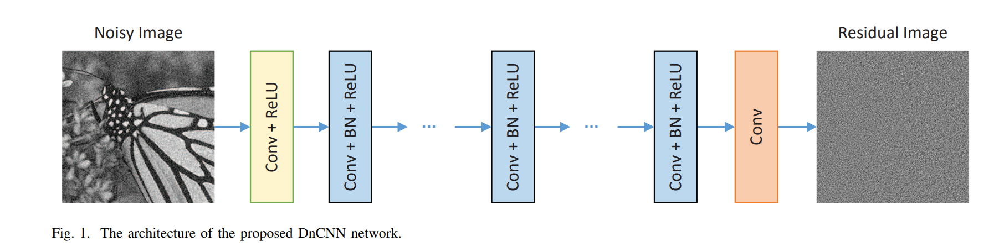

In [ ]:
from keras.layers import BatchNormalization, Add, Subtract, ReLU, Dropout

def dn_cnn(input_shape, filters=64, dropout_rate=0.1):
    input_layer = Input(shape=input_shape)
    x = Conv2D(filters, (3, 3), padding='same', activation='relu', use_bias=True)(input_layer)
    for i in range(15):
        input_x = x
        x = Conv2D(filters, (3, 3), padding='same', use_bias=True)(x)
        x = BatchNormalization()(x)
        x = ReLU()(x)
        x = Add()([x, input_x])
        x = Dropout(dropout_rate)(x)
    x = Conv2D(3, (3, 3), padding='same', use_bias=True)(x)
    output_layer = Subtract()([input_layer, x])
    return Model(input_layer, output_layer, name='dncnn')

In [ ]:
dn_cnn_model = dn_cnn((128, 128, 3), filters=16, dropout_rate=0.0)

In [ ]:
dn_cnn_model.summary()

Model: "dncnn"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_34 (Conv2D)             (None, 128, 128, 16  448         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 re_lu_32 (ReLU)                (None, 128, 128, 16  0           ['conv2d_34[0][0]']              
                                )                                                             

In [ ]:
run_model(dn_cnn_model, x_train, y_train, x_val, y_val)

Epoch 1/20
46/46 [==============================] - ETA: 0s - loss: 4.1314 - psnr_metric: -4.3082
Epoch 1: val_psnr_metric improved from -inf to -15.38162, saving model to dncnn.h5
46/46 [==============================] - 46s 941ms/step - loss: 4.1314 - psnr_metric: -4.3082 - val_loss: 44.0252 - val_psnr_metric: -15.3816
Epoch 2/20
46/46 [==============================] - ETA: 0s - loss: 0.5063 - psnr_metric: 3.1045
Epoch 2: val_psnr_metric improved from -15.38162 to -1.29283, saving model to dncnn.h5
46/46 [==============================] - 41s 890ms/step - loss: 0.5063 - psnr_metric: 3.1045 - val_loss: 1.8919 - val_psnr_metric: -1.2928
Epoch 3/20
46/46 [==============================] - ETA: 0s - loss: 0.2740 - psnr_metric: 5.6740
Epoch 3: val_psnr_metric improved from -1.29283 to 4.06137, saving model to dncnn.h5
46/46 [==============================] - 42s 912ms/step - loss: 0.2740 - psnr_metric: 5.6740 - val_loss: 0.4670 - val_psnr_metric: 4.0614
Epoch 4/20
46/46 [================

### U-Net

U-Nets are another form of fully convolutional neural networks. The original U-Net architecture was proposed in [U-Net: Convolutional Networks for Biomedical Image Segmentation
](https://arxiv.org/abs/1505.04597). As can be seen from the title of the original paper, its goal was to solve semantic segmentation problems in biomedical imaging. However, since semantic segmentation is just another form of image-to-image problem, we can use the U-Net architecture for denoising as well.

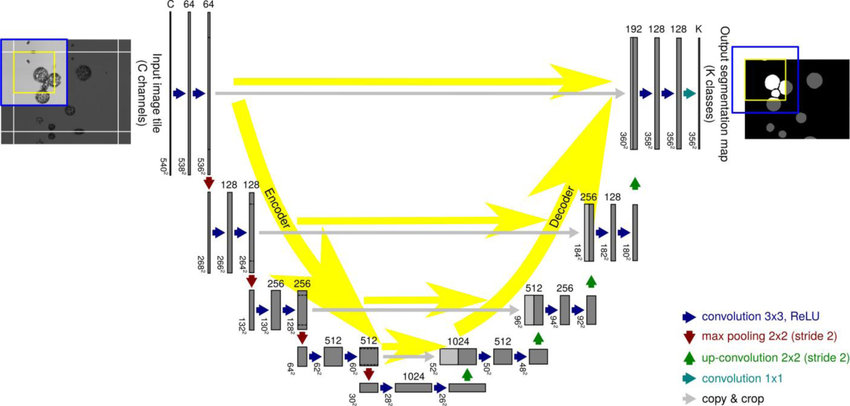

In [ ]:
del dn_cnn_model
gc.collect()

0

In [ ]:
from keras.layers import Conv2DTranspose, concatenate

def u_net(input_shape, filters=16, dropout_rate=0.1, decay=None, bias=True, resnet=False):
    input_layer = Input(shape=input_shape)
    c1 = Conv2D(filters, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(input_layer)
    c1 = BatchNormalization()(c1)
    c1 = ReLU()(c1)
    c1 = Dropout(dropout_rate)(c1)
    c1 = Conv2D(filters, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(c1)
    c1 = BatchNormalization()(c1)
    c1 = ReLU()(c1)
    if resnet:
        c1 = Add()([c1, input_layer])
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(filters * 2, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(p1)
    c2 = BatchNormalization()(c2)
    c2 = ReLU()(c2)
    c2 = Dropout(dropout_rate)(c2)
    c2 = Conv2D(filters * 2, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(c2)
    c2 = BatchNormalization()(c2)
    c2 = ReLU()(c2)
    if resnet:
        skip_p1 = Conv2D(filters * 2, (1, 1), padding='same', use_bias=bias, kernel_regularizer=decay)(p1)
        c2 = Add()([c2, skip_p1])
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(filters * 4, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(p2)
    c3 = BatchNormalization()(c3)
    c3 = ReLU()(c3)
    c3 = Dropout(dropout_rate * 2)(c3)
    c3 = Conv2D(filters * 4, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(c3)
    c3 = BatchNormalization()(c3)
    c3 = ReLU()(c3)
    if resnet:
        skip_p2 = Conv2D(filters * 4, (1, 1), padding='same', use_bias=bias, kernel_regularizer=decay)(p2)
        c3 = Add()([c3, skip_p2])
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(filters * 8, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(p3)
    c4 = BatchNormalization()(c4)
    c4 = ReLU()(c4)
    c4 = Dropout(dropout_rate * 2)(c4)
    c4 = Conv2D(filters * 8, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(c4)
    c4 = BatchNormalization()(c4)
    c4 = ReLU()(c4)
    if resnet:
        skip_p3 = Conv2D(filters * 8, (1, 1), padding='same', use_bias=bias, kernel_regularizer=decay)(p3)
        c4 = Add()([c4, skip_p3])
    p4 = MaxPooling2D(pool_size=(2, 2))(c4)

    c5 = Conv2D(filters * 16, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(p4)
    c5 = BatchNormalization()(c5)
    c5 = ReLU()(c5)
    c5 = Dropout(dropout_rate * 3)(c5)
    c5 = Conv2D(filters * 16, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(c5)
    c5 = BatchNormalization()(c5)
    c5 = ReLU()(c5)
    if resnet:
        skip_p4 = Conv2D(filters * 16, (1, 1), padding='same', use_bias=bias, kernel_regularizer=decay)(p4)
        c5 = Add()([c5, skip_p4])
    # c5 = p4  # Consider removing

    # Expansive path
    u6 = Conv2DTranspose(filters * 8, (2, 2), strides=(2, 2), padding='same', use_bias=bias, kernel_regularizer=decay)(c5)

    # check
    u6 = BatchNormalization()(u6)
    u6 = ReLU()(u6)

    u6 = concatenate([u6, c4])
    c6 = Conv2D(filters * 8, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(u6)
    c6 = BatchNormalization()(c6)
    c6 = ReLU()(c6)
    c6 = Dropout(dropout_rate * 2)(c6)
    c6 = Conv2D(filters * 8, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(c6)
    c6 = BatchNormalization()(c6)
    c6 = ReLU()(c6)
    if resnet:
        skip_u6 = Conv2D(filters * 8, (1, 1), padding='same', use_bias=bias, kernel_regularizer=decay)(u6)
        c6 = Add()([c6, skip_u6])

    u7 = Conv2DTranspose(filters * 4, (2, 2), strides=(2, 2), padding='same', use_bias=bias, kernel_regularizer=decay)(c6)

    # check
    u7 = BatchNormalization()(u7)
    u7 = ReLU()(u7)

    u7 = concatenate([u7, c3])
    c7 = Conv2D(filters * 4, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(u7)
    c7 = BatchNormalization()(c7)
    c7 = ReLU()(c7)
    c7 = Dropout(dropout_rate * 2)(c7)
    c7 = Conv2D(filters * 4, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(c7)
    c7 = BatchNormalization()(c7)
    c7 = ReLU()(c7)
    if resnet:
        skip_u7 = Conv2D(filters * 4, (1, 1), padding='same', use_bias=bias, kernel_regularizer=decay)(u7)
        c7 = Add()([c7, skip_u7])

    u8 = Conv2DTranspose(filters * 2, (2, 2), strides=(2, 2), padding='same', use_bias=bias, kernel_regularizer=decay)(c7)

    # check
    u8 = BatchNormalization()(u8)
    u8 = ReLU()(u8)

    u8 = concatenate([u8, c2])
    c8 = Conv2D(filters * 2, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(u8)
    c8 = BatchNormalization()(c8)
    c8 = ReLU()(c8)
    c8 = Dropout(dropout_rate)(c8)
    c8 = Conv2D(filters * 2, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(c8)
    c8 = BatchNormalization()(c8)
    c8 = ReLU()(c8)
    if resnet:
        skip_u8 = Conv2D(filters * 2, (1, 1), padding='same', use_bias=bias, kernel_regularizer=decay)(u8)
        c8 = Add()([c8, skip_u8])

    u9 = Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding='same', use_bias=bias, kernel_regularizer=decay)(c8)

    # check
    u9 = BatchNormalization()(u9)
    u9 = ReLU()(u9)

    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(filters, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(u9)
    c9 = BatchNormalization()(c9)
    c9 = ReLU()(c9)
    c9 = Dropout(dropout_rate)(c9)
    c9 = Conv2D(filters, (3, 3), padding='same', use_bias=bias, kernel_regularizer=decay)(c9)
    c9 = BatchNormalization()(c9)
    c9 = ReLU()(c9)
    if resnet:
        skip_u9 = Conv2D(filters, (1, 1), padding='same', use_bias=bias, kernel_regularizer=decay)(u9)
        c9 = Add()([c9, skip_u9])
    output_layer = Conv2D(3, (3, 3), padding='same', activation='sigmoid')(c9)
    return Model(input_layer, output_layer, name='u_net')

In [ ]:
u_net_model = u_net((128, 128, 3), filters=16, dropout_rate=0.1)

In [ ]:
u_net_model.summary()

Model: "u_net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_51 (Conv2D)             (None, 128, 128, 16  448         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_45 (BatchN  (None, 128, 128, 16  64         ['conv2d_51[0][0]']              
 ormalization)                  )                                                             

In [ ]:
run_model(u_net_model, x_train, y_train, x_val, y_val)

Epoch 1/20
46/46 [==============================] - ETA: 0s - loss: 0.0331 - psnr_metric: 15.8903
Epoch 1: val_psnr_metric improved from -inf to 7.31167, saving model to u_net.h5
46/46 [==============================] - 37s 672ms/step - loss: 0.0331 - psnr_metric: 15.8903 - val_loss: 0.1950 - val_psnr_metric: 7.3117
Epoch 2/20
46/46 [==============================] - ETA: 0s - loss: 0.0153 - psnr_metric: 18.5269
Epoch 2: val_psnr_metric improved from 7.31167 to 9.87410, saving model to u_net.h5
46/46 [==============================] - 25s 554ms/step - loss: 0.0153 - psnr_metric: 18.5269 - val_loss: 0.1073 - val_psnr_metric: 9.8741
Epoch 3/20
46/46 [==============================] - ETA: 0s - loss: 0.0137 - psnr_metric: 19.0267
Epoch 3: val_psnr_metric improved from 9.87410 to 11.97673, saving model to u_net.h5
46/46 [==============================] - 25s 553ms/step - loss: 0.0137 - psnr_metric: 19.0267 - val_loss: 0.0669 - val_psnr_metric: 11.9767
Epoch 4/20
46/46 [====================

### Transfer learning

In [ ]:
del u_net_model
gc.collect()

1890

In [ ]:
from tensorflow.keras.applications import MobileNetV2	
base_model = MobileNetV2(input_shape=[128, 128, 3], include_top=False)

# Use the activations of these layers
layer_names = [
    'block_1_expand_relu',   # 64x64
    'block_3_expand_relu',   # 32x32
    'block_6_expand_relu',   # 16x16
    'block_13_expand_relu',  # 8x8
    'block_16_project',      # 4x4
]
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model
down_stack = tf.keras.Model(inputs=base_model.input, outputs=base_model_outputs)

down_stack.trainable = False

In [ ]:
!pip install -q git+https://github.com/tensorflow/examples.git

In [ ]:
from tensorflow_examples.models.pix2pix import pix2pix
up_stack = [
    pix2pix.upsample(512, 3),  # 4x4 -> 8x8
    pix2pix.upsample(256, 3),  # 8x8 -> 16x16
    pix2pix.upsample(128, 3),  # 16x16 -> 32x32
    pix2pix.upsample(64, 3),   # 32x32 -> 64x64
]

In [ ]:
def reinforced_unet_model():
  inputs = Input(shape=[128, 128, 3])

  # Downsampling through the model
  skips = down_stack(inputs)
  x = skips[-1]
  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = concatenate([x, skip])

  # This is the last layer of the model
  last = Conv2DTranspose(
      filters=3, kernel_size=3, strides=2,
      padding='same')  #64x64 -> 128x128

  x = last(x)

  return Model(inputs=inputs, outputs=x, name='reinforced_unet')

In [ ]:
reinforced_u_net_model = reinforced_unet_model()

In [ ]:
reinforced_u_net_model.summary()

Model: "reinforced_unet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 model (Functional)             [(None, 64, 64, 96)  1841984     ['input_6[0][0]']                
                                , (None, 32, 32, 14                                               
                                4),                                                               
                                 (None, 16, 16, 192                                               
                                ),                                                  

In [ ]:
run_model(reinforced_u_net_model, x_train, y_train, x_val, y_val)

Epoch 1/20
46/46 [==============================] - ETA: 0s - loss: 0.4135 - psnr_metric: 4.5877
Epoch 1: val_psnr_metric improved from -inf to 7.11714, saving model to reinforced_unet.h5
46/46 [==============================] - 35s 594ms/step - loss: 0.4135 - psnr_metric: 4.5877 - val_loss: 0.1959 - val_psnr_metric: 7.1171
Epoch 2/20
46/46 [==============================] - ETA: 0s - loss: 0.1147 - psnr_metric: 9.5049
Epoch 2: val_psnr_metric improved from 7.11714 to 9.93651, saving model to reinforced_unet.h5
46/46 [==============================] - 21s 462ms/step - loss: 0.1147 - psnr_metric: 9.5049 - val_loss: 0.1025 - val_psnr_metric: 9.9365
Epoch 3/20
46/46 [==============================] - ETA: 0s - loss: 0.0751 - psnr_metric: 11.3341
Epoch 3: val_psnr_metric improved from 9.93651 to 11.55913, saving model to reinforced_unet.h5
46/46 [==============================] - 21s 450ms/step - loss: 0.0751 - psnr_metric: 11.3341 - val_loss: 0.0708 - val_psnr_metric: 11.5591
Epoch 4/20
4

### Evaluating the model

In [ ]:
!zip -r logs.zip /content/logs

  adding: content/logs/ (stored 0%)
  adding: content/logs/encoder_decoder/ (stored 0%)
  adding: content/logs/encoder_decoder/train/ (stored 0%)
  adding: content/logs/encoder_decoder/train/events.out.tfevents.1648371909.b54140037bcc.1401.0.v2 (deflated 70%)
  adding: content/logs/encoder_decoder/train/events.out.tfevents.1648372335.b54140037bcc.1633.0.v2 (deflated 70%)
  adding: content/logs/encoder_decoder/validation/ (stored 0%)
  adding: content/logs/encoder_decoder/validation/events.out.tfevents.1648371925.b54140037bcc.1401.1.v2 (deflated 76%)
  adding: content/logs/encoder_decoder/validation/events.out.tfevents.1648372351.b54140037bcc.1633.1.v2 (deflated 76%)
  adding: content/logs/u_net/ (stored 0%)
  adding: content/logs/u_net/train/ (stored 0%)
  adding: content/logs/u_net/train/events.out.tfevents.1648369158.b54140037bcc.411.2.v2 (deflated 71%)
  adding: content/logs/u_net/train/events.out.tfevents.1648374029.b54140037bcc.1909.4.v2 (deflated 68%)
  adding: content/logs/u_net

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
gc.collect()

1488

### Load saved models

In [ ]:
models_dict = {}

Note that we used a custom object (the PSNR metric). Keras cannot serialzie it on its own. Hence, we need to specify its name when loading the model via the custom_objects argument:

In [ ]:
from keras.models import load_model
for name in os.listdir():
  if name[-3:] == '.h5':
    models_dict[name[:-3]] = load_model(name, custom_objects={'psnr_metric': psnr_metric})

In [ ]:
models_dict

{'dncnn': <keras.engine.functional.Functional at 0x7fdcce02e510>,
 'encoder_decoder': <keras.engine.functional.Functional at 0x7fdccc70b110>,
 'reinforced_unet': <keras.engine.functional.Functional at 0x7fdccc912450>,
 'u_net': <keras.engine.functional.Functional at 0x7fdcce26cb50>}

### Testing

In [ ]:
def test_single_image(noisy, clean, model):
  img_x = np_to_cv(noisy)
  img_y = np_to_cv(clean)

  # We need to add a fictitious batch_size of 1
  img_pred = np_to_cv(model.predict(np.expand_dims(x_test[1, :, :, :], axis=0))[0, :, :, :])

  _, denoised = noise_and_denoise(0., x_test[1, :, :, :], show=False)

  print('Noisy image')
  cv2_imshow(img_x)

  print('Real image')
  cv2_imshow(img_y)

  print('Non-local means denoised image')
  cv2_imshow(denoised)

  print('Neural network output')
  cv2_imshow(img_pred)

  print('Neural netowk: ', evaluate_images(img_pred, img_y))
  print('Non-local means: ', evaluate_images(denoised, img_y))

Encoder-decoder

Noisy image


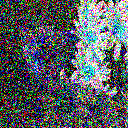

Real image


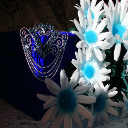

Non-local means denoised image


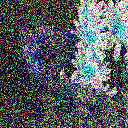

Neural network output


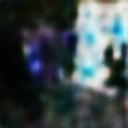

Neural netowk:  {'SSIM': 0.40460861681237215, 'PSNR': 17.28403890611422, 'MSE': 0.018689432287161186}
Non-local means:  {'SSIM': 0.13835036916245236, 'PSNR': 9.306847269408676, 'MSE': 0.11730466215668252}


In [ ]:
test_single_image(x_test[1, :, :, :], y_test[1, :, :, :], models_dict['encoder_decoder'])

DNCNN:

Noisy image


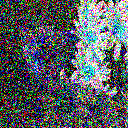

Real image


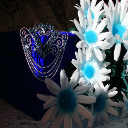

Non-local means denoised image


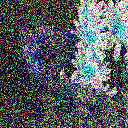

Neural network output


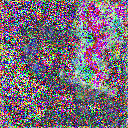

Neural netowk:  {'SSIM': 0.04803553019778605, 'PSNR': 6.869691672447271, 'MSE': 0.20560365592059945}
Non-local means:  {'SSIM': 0.13835036916245236, 'PSNR': 9.306847269408676, 'MSE': 0.11730466215668252}


In [ ]:
test_single_image(x_test[1, :, :, :], y_test[1, :, :, :], models_dict['dncnn'])

U-Net:

Noisy image


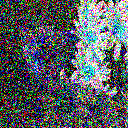

Real image


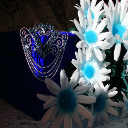

Non-local means denoised image


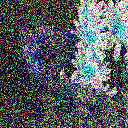

Neural network output


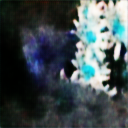

Neural netowk:  {'SSIM': 0.5369561247884641, 'PSNR': 19.635273566753494, 'MSE': 0.010876086258390203}
Non-local means:  {'SSIM': 0.13835036916245236, 'PSNR': 9.306847269408676, 'MSE': 0.11730466215668252}


In [ ]:
test_single_image(x_test[1, :, :, :], y_test[1, :, :, :], models_dict['u_net'])

Reinforced U-Net:

Noisy image


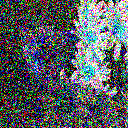

Real image


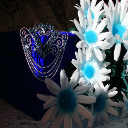

Non-local means denoised image


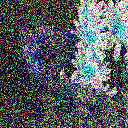

Neural network output


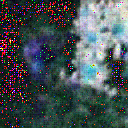

Neural netowk:  {'SSIM': 0.2318182836890149, 'PSNR': 13.528215371248253, 'MSE': 0.0443790971696583}
Non-local means:  {'SSIM': 0.13835036916245236, 'PSNR': 9.306847269408676, 'MSE': 0.11730466215668252}


In [ ]:
test_single_image(x_test[1, :, :, :], y_test[1, :, :, :], models_dict['reinforced_unet'])

And indeed the neural networks performed much better.